In [0]:
import urllib.request
import io
import gzip

import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [0]:
from google.colab import drive
drive.mount('/content/drive')


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
os.chdir('/content/drive/My Drive/CreditFraud')

!kaggle datasets download -d https://www.kaggle.com/mlg-ulb/creditcardfraud

In [0]:
# Loading the dataset from the local drive
dataset = pd.read_csv('/content/drive/My Drive/CreditFraud/creditcard.csv')

In [0]:
print(dataset.head())

   Time        V1        V2        V3  ...       V27       V28  Amount  Class
0   0.0 -1.359807 -0.072781  2.536347  ...  0.133558 -0.021053  149.62      0
1   0.0  1.191857  0.266151  0.166480  ... -0.008983  0.014724    2.69      0
2   1.0 -1.358354 -1.340163  1.773209  ... -0.055353 -0.059752  378.66      0
3   1.0 -0.966272 -0.185226  1.792993  ...  0.062723  0.061458  123.50      0
4   2.0 -1.158233  0.877737  1.548718  ...  0.219422  0.215153   69.99      0

[5 rows x 31 columns]


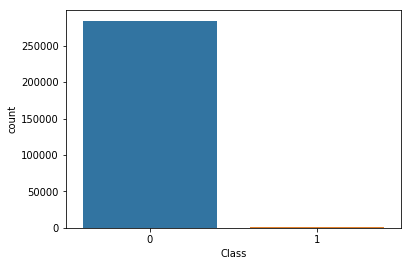

In [0]:
#Plotting the graph of the output classes

sns.countplot(dataset['Class'])

# Performing undersampling in this scenario is pretty much useless as there is a way too much difference between the classes and no matter how many
#instances of the majority classes are removed, it will never be sufficient and on the other hand,
# Rather than improving the performance of the model, it will deteriorate due to loss of important feature instances

In [0]:
x = dataset.iloc[0:-1,1:-2]

In [0]:
x.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153


In [0]:
y = dataset.iloc[0:-1,-1:]

In [0]:
y.head()

,Class
0,0
1,0
2,0
3,0
4,0


In [0]:
y= np.ravel(y)

In [0]:
# importing imbalance-learn or imblearn 
from imblearn.over_sampling import RandomOverSampler

# random oversampling
ros = RandomOverSampler(random_state=0)
X_resampled, y_resampled = ros.fit_resample(x, y)

# using Counter to display results of naive oversampling
from collections import Counter
print(sorted(Counter(y_resampled).items()))

[(0, 284314), (1, 284314)]


The above Given code balances the number of instances in both of the classes

In [0]:
# importing SMOTE
from imblearn.over_sampling import SMOTE

# applying SMOTE to our data and checking the class instance counts
X_resampled1, y_resampled1 = SMOTE().fit_resample(x, y)
print(sorted(Counter(y_resampled1).items()))

[(0, 284314), (1, 284314)]


One Important thing to remember is that Stratified K-fold Cross Validation Does not take panda Dataframe as an input so it is necessary to convert them into numpy array beforehand

In [0]:
x = np.array(x)

In [0]:
print(len(x))

284806


In [0]:
y = np.array(y)

In [0]:
print(y)

[0 0 0 ... 0 0 0]


In [0]:
from sklearn.model_selection import StratifiedKFold

In [0]:
skf = StratifiedKFold(n_splits=480)

skf.get_n_splits(x, y)

print(skf)

StratifiedKFold(n_splits=480, random_state=None, shuffle=False)


In [0]:
for train_index, val_index in skf.split(x,y): 
    print("Train:", train_index, "Validation:", val_index) 
    X_train, X_test = x[train_index], x[val_index] 
    y_train, y_test = y[train_index], y[val_index]

Train: [   594    595    596 ... 284803 284804 284805] Validation: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 

In [0]:
print(newd)

StratifiedKFold(n_splits=20, random_state=None, shuffle=True)


In [0]:
print(len(X_train), len(y_train))

284213 284213


In [0]:
print(len(X_test), len(y_test))

593 593


Now We will import and use Leave P out K-fold cross Validation. Here we will use a special case of 
this type if cross validation called Leave one out K-fold cross Valdiation because this approach is
computation intensive and it taxes out the system.

In [0]:
from sklearn.model_selection import LeavePOut


In [0]:
lpo = LeavePOut(1)

lpo.get_n_splits(x)

284806

In [0]:
print(lpo)

LeavePOut(p=1)


In [0]:
for train_index, test_index in lpo.split(x):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train1, X_test1 = x[train_index], x[test_index]
    y_train1, y_test1 = y[train_index], y[test_index]

TRAIN: [     1      2      3 ... 284803 284804 284805] TEST: [0]
TRAIN: [     0      2      3 ... 284803 284804 284805] TEST: [1]
TRAIN: [     0      1      3 ... 284803 284804 284805] TEST: [2]
TRAIN: [     0      1      2 ... 284803 284804 284805] TEST: [3]
TRAIN: [     0      1      2 ... 284803 284804 284805] TEST: [4]
TRAIN: [     0      1      2 ... 284803 284804 284805] TEST: [5]
TRAIN: [     0      1      2 ... 284803 284804 284805] TEST: [6]
TRAIN: [     0      1      2 ... 284803 284804 284805] TEST: [7]
TRAIN: [     0      1      2 ... 284803 284804 284805] TEST: [8]
TRAIN: [     0      1      2 ... 284803 284804 284805] TEST: [9]
TRAIN: [     0      1      2 ... 284803 284804 284805] TEST: [10]
TRAIN: [     0      1      2 ... 284803 284804 284805] TEST: [11]
TRAIN: [     0      1      2 ... 284803 284804 284805] TEST: [12]
TRAIN: [     0      1      2 ... 284803 284804 284805] TEST: [13]
TRAIN: [     0      1      2 ... 284803 284804 284805] TEST: [14]
TRAIN: [     0      